<a href="https://colab.research.google.com/github/kristupas-g/AnyShipsHere/blob/main/results_interpretation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### ENV preparation

In [87]:
%%capture
!pip install openmim wheel
!pip install torch==1.12.0 torchvision
!mim install mmcv-full
!mim install mmdet
!git clone https://github.com/kristupas-g/mmrotate.git
%cd mmrotate
!pip install -e .
!pip uninstall mmcv mmcv-full -y
!mim install mmcv-full
!pip install yapf==0.40.1

In [88]:
import torch

torch.cuda.is_available()

True

In [89]:
import mmrotate
print(mmrotate.__version__)

0.3.4


### Data prep

In [90]:
!cp -R /content/drive/MyDrive/DataForGmm/dior/png_datasets/png_datasets/60_percent_hr.zip /content/dataset.zip

In [91]:
import zipfile

def unzip_file(zip_path, dest_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(dest_path)

In [92]:
unzip_file("/content/dataset.zip", "/content/dataset")

#### Removing metadata

In [93]:
import os
import glob

root_directory = "/content/dataset"

for folder in glob.glob(os.path.join(root_directory, "*annotations*")):

    for txt_file in glob.glob(os.path.join(folder, "*.txt")):
        with open(txt_file, "r") as f:
            lines = f.readlines()

        lines = lines[2:]

        with open(txt_file, "w") as f:
            f.writelines(lines)

#### Removing commas

In [94]:
for filepath in glob.glob(f"{root_directory}/**/*txt", recursive=True):
    # Check if "annotations" is in the directory name
    if "annotations" in os.path.dirname(filepath):
        # Open each text file
        with open(filepath, 'r') as f:
            lines = f.readlines()

        # Remove commas from each line
        new_lines = []
        for line in lines:
            new_line = ' '.join(line.strip().split(', '))
            new_lines.append(new_line)

        # Write back the modified content
        with open(filepath, 'w') as f:
            f.write('\n'.join(new_lines))


### Config adjustment

In [95]:
config_path = "/content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py"

#### Setting dataset paths

In [96]:
%%writefile /content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py
_base_ = '/content/mmrotate/configs/redet/redet_re50_refpn_1x_dota_le90.py'

dataset_type = 'DOTADataset'
classes = ('ship', )

data = dict(
    samples_per_gpu=2,
    workers_per_gpu=2,

    train = dict(
        type=dataset_type,
        classes=classes,
        ann_file='/content/dataset/train_annotations',
        img_prefix='/content/dataset/train_images'
    ),

    val = dict(
        type=dataset_type,
        classes=classes,
        ann_file='/content/dataset/val_annotations',
        img_prefix='/content/dataset/val_images'
    ),

    test = dict(
        type=dataset_type,
        classes=classes,
        ann_file='/content/dataset/test_annotations',
        img_prefix='/content/dataset/test_images'
    )
)

Overwriting /content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py


#### Changing model shape to use a single class

In [97]:
%%writefile -a /content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py

angle_version = 'le90'
seed = 1234

model = dict(
    roi_head = dict(
        type = 'RoITransRoIHead',
        version = angle_version,
        num_stages = 2,
        stage_loss_weights = [1, 1],
        bbox_roi_extractor = [
            dict(
                type = 'SingleRoIExtractor',
                roi_layer = dict(
                    type='RoIAlign', output_size=7, sampling_ratio=0
                ),
                out_channels = 256,
                featmap_strides = [4, 8, 16, 32]
            ),
            dict(
                type = 'RotatedSingleRoIExtractor',
                roi_layer = dict(
                    type = 'RiRoIAlignRotated',
                    out_size = 7,
                    num_samples = 2,
                    num_orientations = 8,
                    clockwise = True
                ),
                out_channels = 256,
                featmap_strides = [4, 8, 16, 32]
            ),
        ],
        bbox_head = [
            dict(
                type = 'RotatedShared2FCBBoxHead',
                in_channels = 256,
                fc_out_channels = 1024,
                roi_feat_size = 7,
                num_classes = 1,
                bbox_coder = dict(
                    type = 'DeltaXYWHAHBBoxCoder',
                    angle_range = angle_version,
                    norm_factor = 2,
                    edge_swap = True,
                    target_means = [0., 0., 0., 0., 0.],
                    target_stds = [0.1, 0.1, 0.2, 0.2, 1]
                ),
                reg_class_agnostic = True,
                loss_cls = dict(
                    type = 'CrossEntropyLoss',
                    use_sigmoid = False,
                    loss_weight = 1.0
                ),
                loss_bbox = dict(
                    type = 'SmoothL1Loss',
                    beta = 1.0,
                    loss_weight = 1.0
                )
            ),
            dict(
                type = 'RotatedShared2FCBBoxHead',
                in_channels = 256,
                fc_out_channels = 1024,
                roi_feat_size = 7,
                num_classes = 1,
                bbox_coder = dict(
                    type = 'DeltaXYWHAOBBoxCoder',
                    angle_range = angle_version,
                    norm_factor = None,
                    edge_swap = True,
                    proj_xy = True,
                    target_means = [0., 0., 0., 0., 0.],
                    target_stds = [0.05, 0.05, 0.1, 0.1, 0.5]
                ),
                reg_class_agnostic = False,
                loss_cls = dict(
                    type = 'CrossEntropyLoss',
                    use_sigmoid = False,
                    loss_weight = 1.0
                ),
                loss_bbox=dict(
                    type = 'SmoothL1Loss', beta = 1.0, loss_weight = 1.0
                )
            )
        ]
    ),
)

Appending to /content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py


#### Changing preprocessing

In [98]:
%%writefile -a /content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py

img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)

train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(type='RRandomCrop', crop_size=(1024, 1024), crop_type="absolute"),
    dict(type='RResize', img_scale=(1024, 1024)),
    dict(
        type='RRandomFlip',
        flip_ratio=[0.25, 0.25, 0.25],
        direction=['horizontal', 'vertical', 'diagonal'],
        version=angle_version),
    dict(type='Normalize', **img_norm_cfg),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]

test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='RRandomCrop', crop_size=(1024, 1024), crop_type="absolute"),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        flip=False,
        transforms=[
            dict(type='RResize'),
            dict(type='Normalize', **img_norm_cfg),
            dict(type='Pad', size_divisor=32),
            dict(type='DefaultFormatBundle'),
            dict(type='Collect', keys=['img'])
        ])
]

Appending to /content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py


#### Changing learning scheduling

In [99]:
%%writefile -a /content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py

finetune_epochs = 0
runner = dict(type='EpochBasedRunner', max_epochs=12 + finetune_epochs)

optimizer = dict(type='SGD', lr=0.003, momentum=0.9, weight_decay=0.0001)

lr_config = dict(
    policy='step',
    warmup='linear',
    warmup_iters=100,
    warmup_ratio=1.0 / 3,
    step=[8,11]
)

Appending to /content/mmrotate/configs/redet/redet_re50_refpn_1x_custom_ie90.py


### Dataset visualization

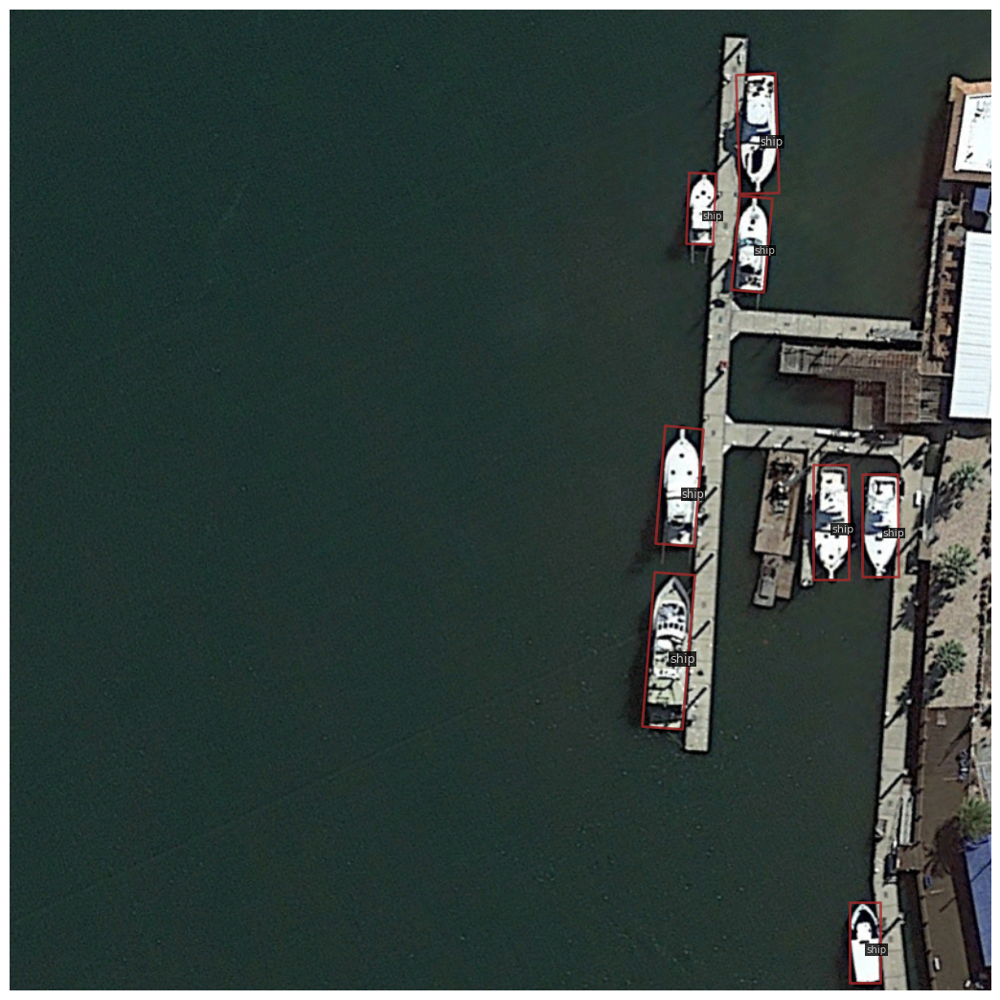

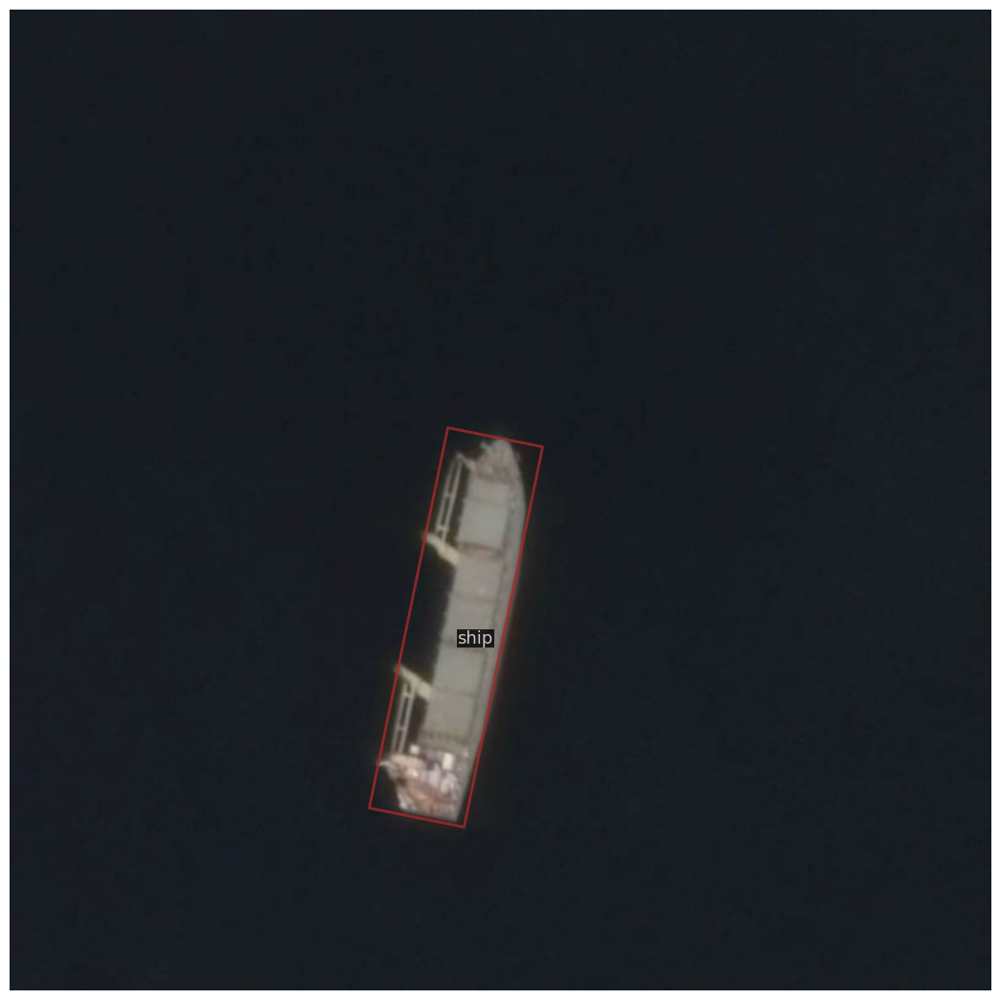

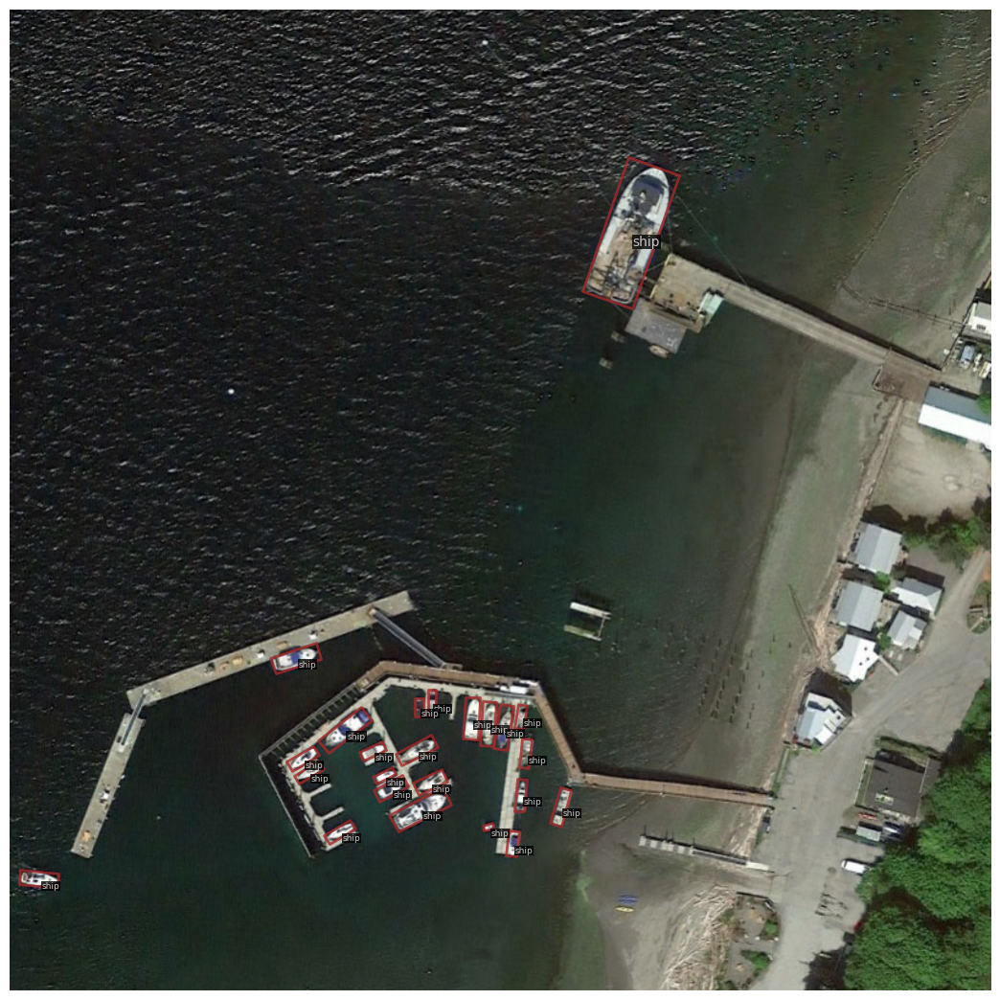

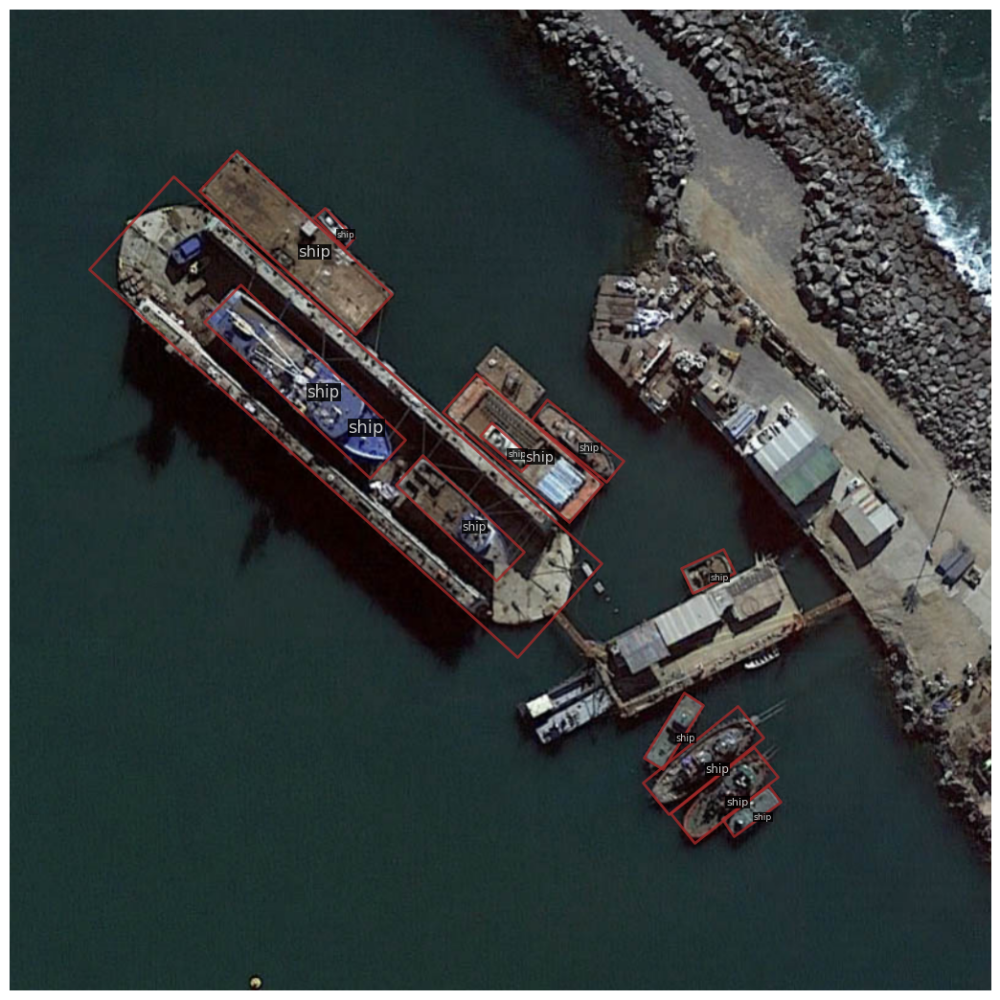

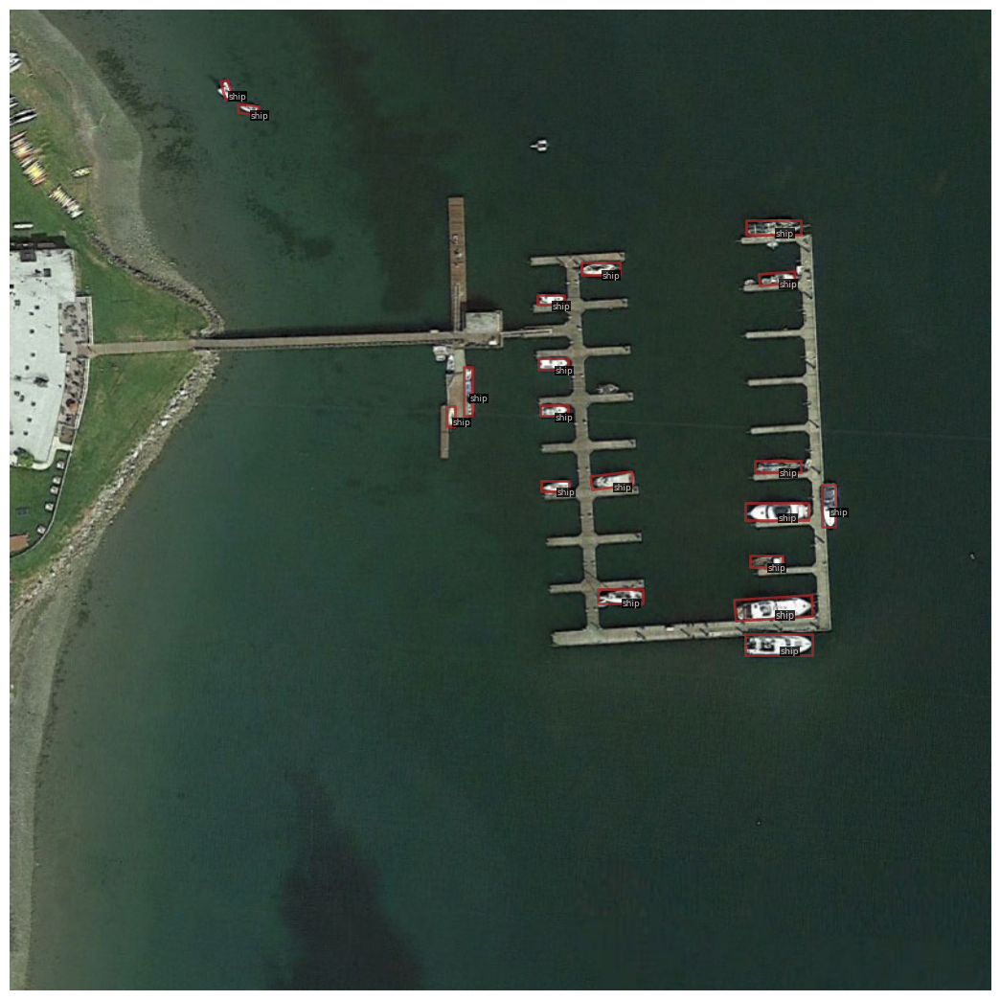

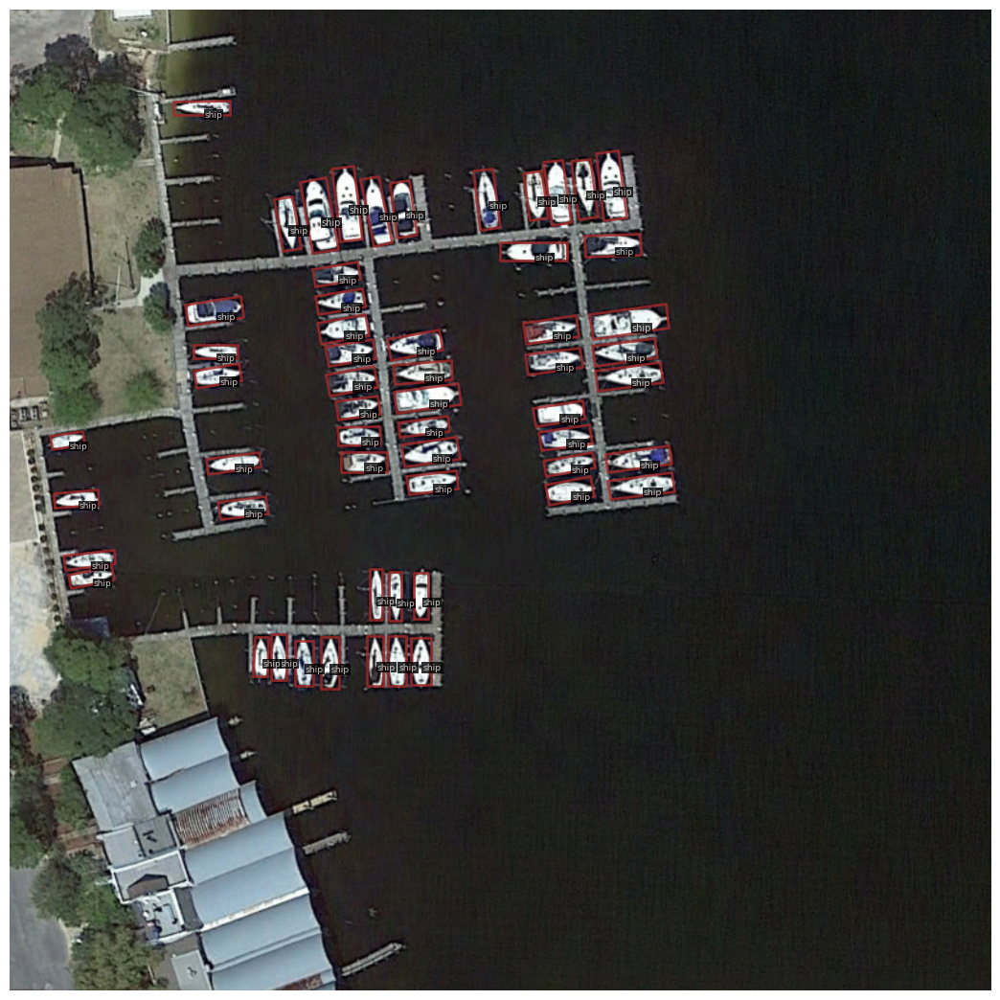

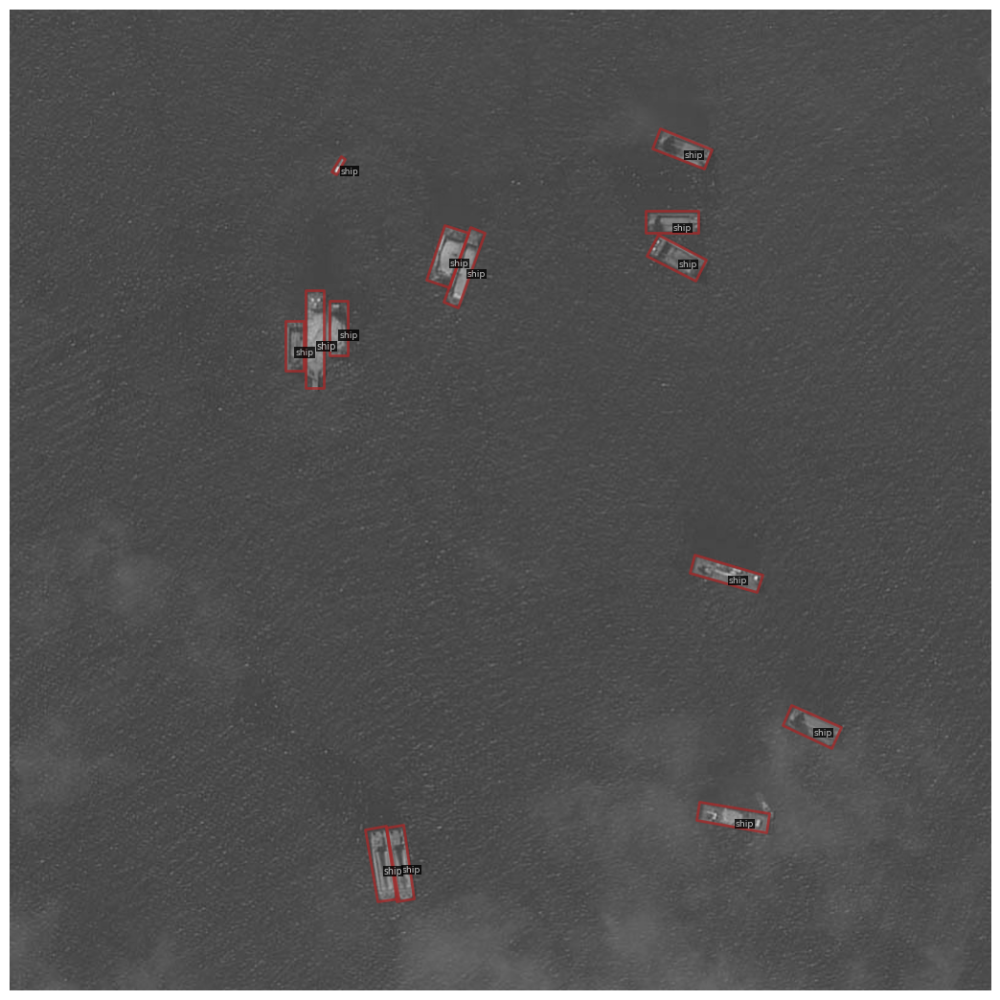

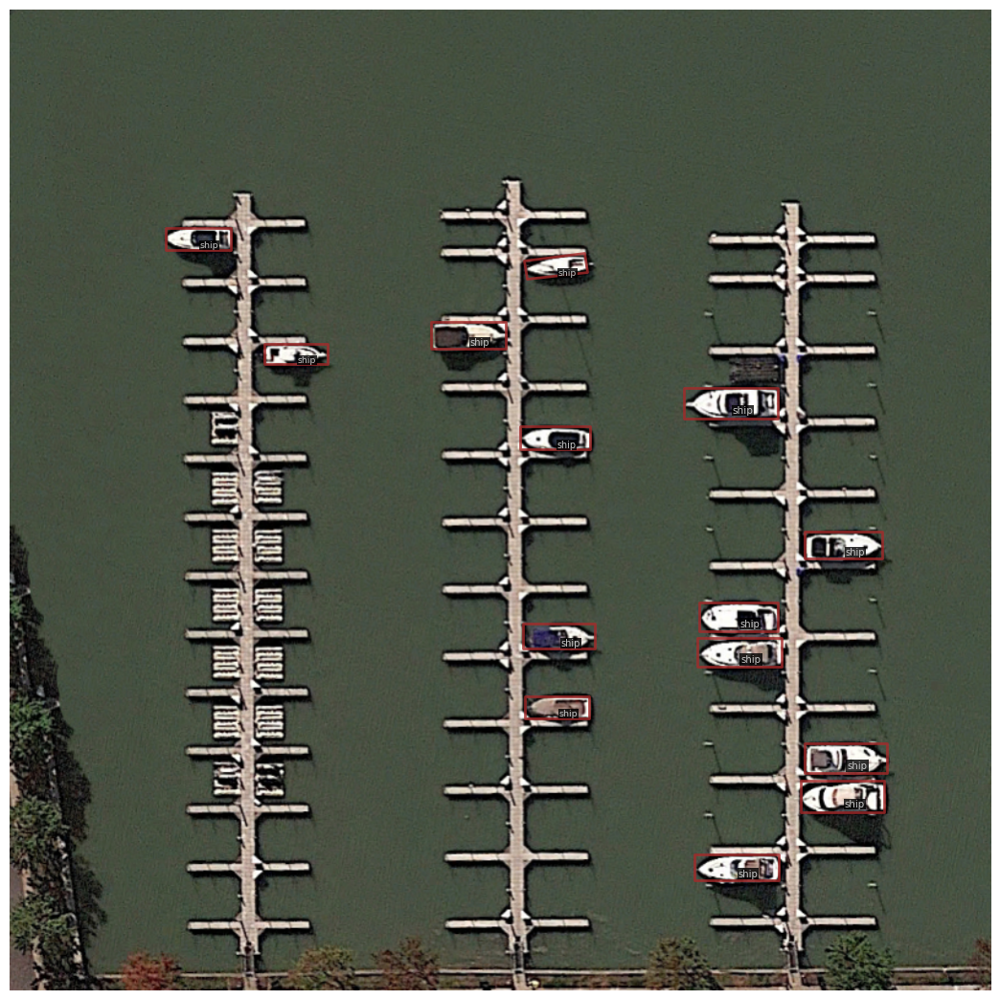

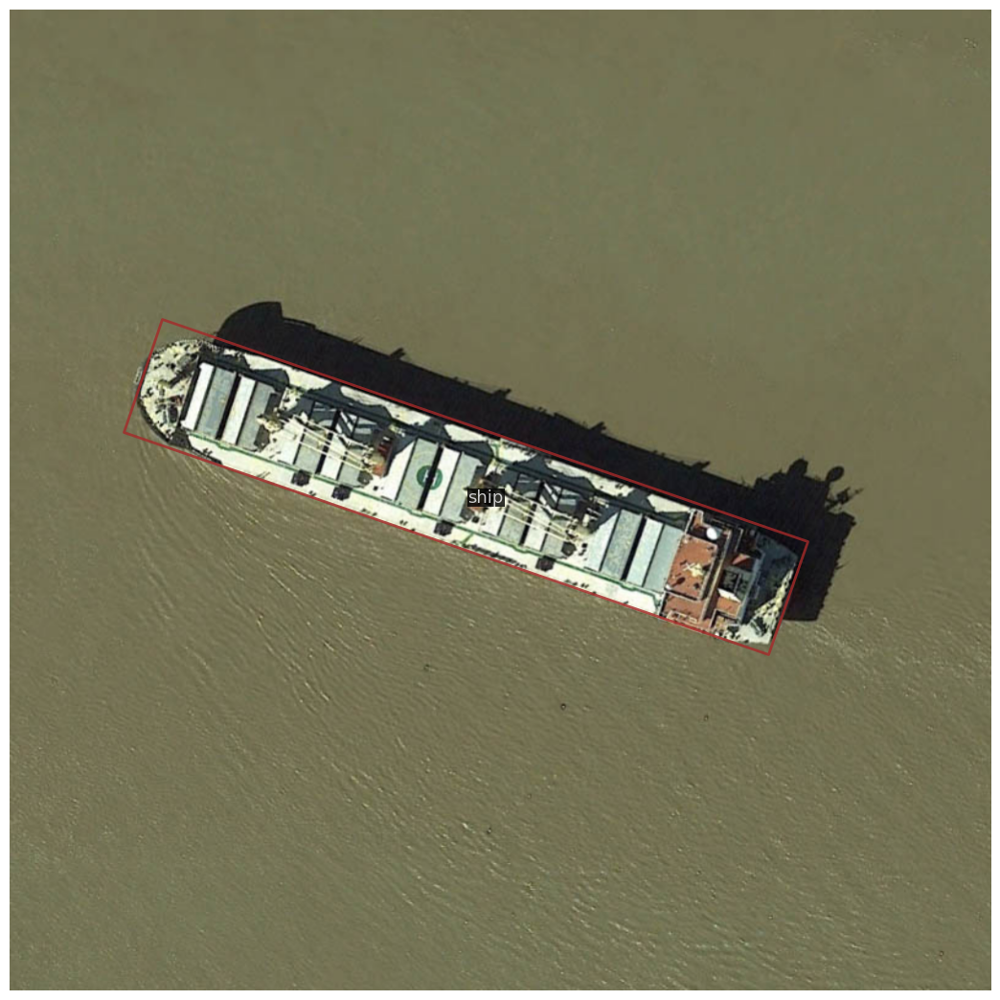

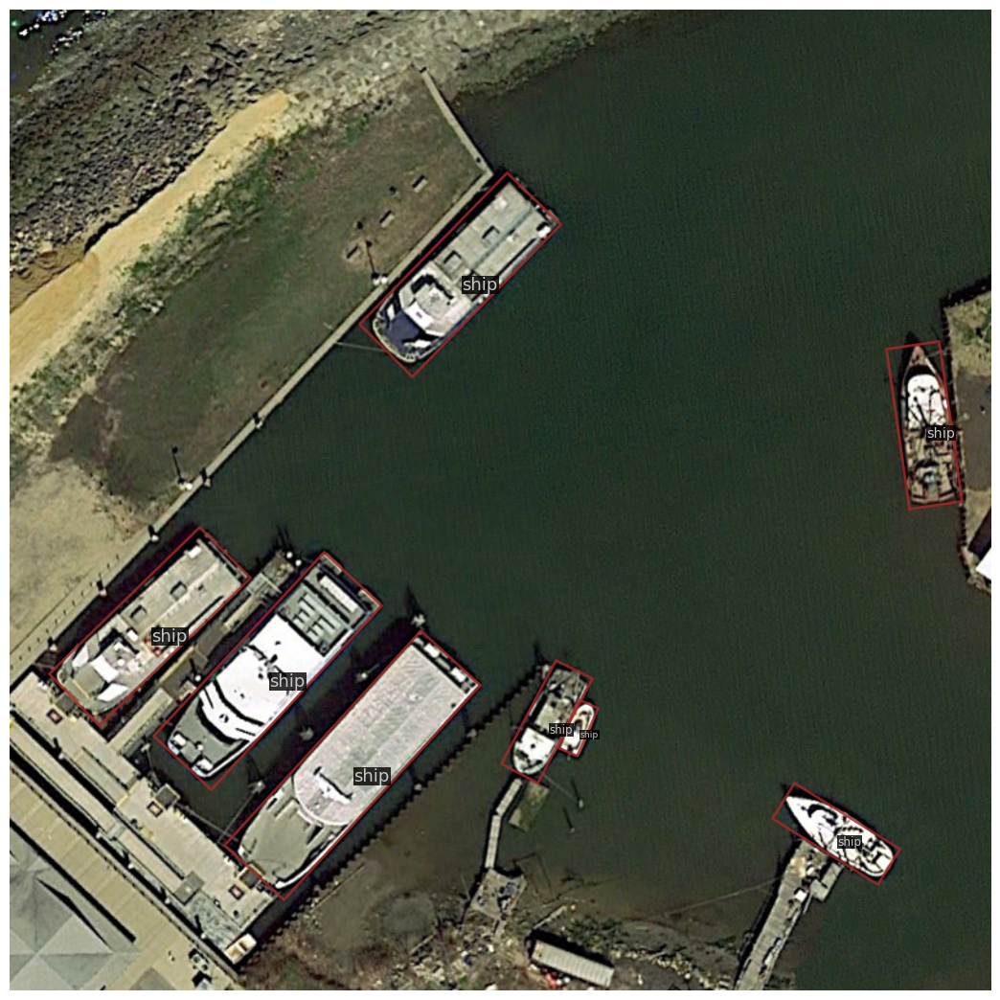

KeyboardInterrupt: ignored

In [ ]:
#%%script false --no-raise-error
import os
from collections.abc import Sequence
from pathlib import Path

import mmcv
from mmcv import Config
from mmdet.datasets.builder import build_dataset
from mmrotate.core.visualization import imshow_det_rbboxes

def retrieve_data_cfg(config_path, skip_type, cfg_options):
    def skip_pipeline_steps(config):
        config['pipeline'] = [
            x for x in config.pipeline if x['type'] not in skip_type
        ]

    cfg = Config.fromfile(config_path)
    if cfg_options is not None:
        cfg.merge_from_dict(cfg_options)
    train_data_cfg = cfg.data.train
    while 'dataset' in train_data_cfg and train_data_cfg[
            'type'] != 'MultiImageMixDataset':
        train_data_cfg = train_data_cfg['dataset']

    if isinstance(train_data_cfg, Sequence):
        [skip_pipeline_steps(c) for c in train_data_cfg]
    else:
        skip_pipeline_steps(train_data_cfg)

    return cfg

def browse_dataset(config, skip_type=['DefaultFormatBundle', 'Normalize', 'Collect'],
                   cfg_options=None, output_dir=None, show=True,
                   show_interval=2):
    cfg = retrieve_data_cfg(config, skip_type, cfg_options)

    dataset = build_dataset(cfg.data.train)

    for item in dataset:
        filename = os.path.join(output_dir, Path(item['filename']).name) if output_dir else None

        gt_bboxes = item['gt_bboxes']
        gt_labels = item['gt_labels']

        imshow_det_rbboxes(
            item['img'],
            gt_bboxes,
            gt_labels,
            class_names=dataset.CLASSES,
            score_thr=0,
            show=show,
            wait_time=show_interval,
            out_file=filename,
            bbox_color=dataset.PALETTE,
            text_color=(200, 200, 200))

        if not show:
            # If not showing the images, we can add a delay to simulate the interval
            time.sleep(show_interval)

browse_dataset(config=config_path, show=True)

### Training log analysis

#### Supporting code

In [100]:
%cd /content/mmrotate

/content/mmrotate


In [108]:
import json
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set_style('dark')  # You can change this according to your preference

def load_json_logs(json_logs):
    log_dicts = [{} for _ in json_logs]
    for json_log, log_dict in zip(json_logs, log_dicts):
        with open(json_log, 'r') as log_file:
            for line in log_file:
                log = json.loads(line.strip())
                if 'epoch' not in log:
                    continue
                epoch = log.pop('epoch')
                if epoch not in log_dict:
                    log_dict[epoch] = defaultdict(list)
                for k, v in log.items():
                    log_dict[epoch][k].append(v)
    return log_dicts

def cal_train_time(log_dicts, json_logs, include_outliers=False):
    for i, log_dict in enumerate(log_dicts):
        print(f'{"-" * 5}Analyze train time of {json_logs[i]}{"-" * 5}')
        all_times = []
        for epoch in log_dict.keys():
            if include_outliers:
                all_times.append(log_dict[epoch]['time'])
            else:
                all_times.append(log_dict[epoch]['time'][1:])
        all_times = np.array(all_times)
        epoch_ave_time = all_times.mean(-1)
        slowest_epoch = epoch_ave_time.argmax()
        fastest_epoch = epoch_ave_time.argmin()
        std_over_epoch = epoch_ave_time.std()
        print(f'slowest epoch {slowest_epoch + 1}, average time is {epoch_ave_time[slowest_epoch]:.4f}')
        print(f'fastest epoch {fastest_epoch + 1}, average time is {epoch_ave_time[fastest_epoch]:.4f}')
        print(f'time std over epochs is {std_over_epoch:.4f}')
        print(f'average iter time: {np.mean(all_times):.4f} s/iter')
        print()

import json
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set_style('dark')  # You can change this according to your preference

def load_json_logs(json_logs):
    log_dicts = [{} for _ in json_logs]
    for json_log, log_dict in zip(json_logs, log_dicts):
        with open(json_log, 'r') as log_file:
            for line in log_file:
                log = json.loads(line.strip())
                if 'epoch' not in log:
                    continue
                epoch = log.pop('epoch')
                if epoch not in log_dict:
                    log_dict[epoch] = defaultdict(list)
                for k, v in log.items():
                    log_dict[epoch][k].append(v)
    return log_dicts

def cal_train_time(log_dicts, json_logs, include_outliers=False):
    for i, log_dict in enumerate(log_dicts):
        print(f'{"-" * 5}Analyze train time of {json_logs[i]}{"-" * 5}')
        all_times = []
        for epoch in log_dict.keys():
            if include_outliers:
                all_times.append(log_dict[epoch]['time'])
            else:
                all_times.append(log_dict[epoch]['time'][1:])
        all_times = np.array(all_times)
        epoch_ave_time = all_times.mean(-1)
        slowest_epoch = epoch_ave_time.argmax()
        fastest_epoch = epoch_ave_time.argmin()
        std_over_epoch = epoch_ave_time.std()
        print(f'slowest epoch {slowest_epoch + 1}, average time is {epoch_ave_time[slowest_epoch]:.4f}')
        print(f'fastest epoch {fastest_epoch + 1}, average time is {epoch_ave_time[fastest_epoch]:.4f}')
        print(f'time std over epochs is {std_over_epoch:.4f}')
        print(f'average iter time: {np.mean(all_times):.4f} s/iter')
        print()

import json
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set_style('dark')  # You can change this according to your preference

def load_json_logs(json_logs):
    log_dicts = [{} for _ in json_logs]
    for json_log, log_dict in zip(json_logs, log_dicts):
        with open(json_log, 'r') as log_file:
            for line in log_file:
                log = json.loads(line.strip())
                if 'epoch' not in log:
                    continue
                epoch = log.pop('epoch')
                if epoch not in log_dict:
                    log_dict[epoch] = defaultdict(list)
                for k, v in log.items():
                    log_dict[epoch][k].append(v)
    return log_dicts

def cal_train_time(log_dicts, json_logs, include_outliers=False):
    for i, log_dict in enumerate(log_dicts):
        print(f'{"-" * 5}Analyze train time of {json_logs[i]}{"-" * 5}')
        all_times = []
        for epoch in log_dict.keys():
            if include_outliers:
                all_times.append(log_dict[epoch]['time'])
            else:
                all_times.append(log_dict[epoch]['time'][1:])
        all_times = np.array(all_times)
        epoch_ave_time = all_times.mean(-1)
        slowest_epoch = epoch_ave_time.argmax()
        fastest_epoch = epoch_ave_time.argmin()
        std_over_epoch = epoch_ave_time.std()
        print(f'slowest epoch {slowest_epoch + 1}, average time is {epoch_ave_time[slowest_epoch]:.4f}')
        print(f'fastest epoch {fastest_epoch + 1}, average time is {epoch_ave_time[fastest_epoch]:.4f}')
        print(f'time std over epochs is {std_over_epoch:.4f}')
        print(f'average iter time: {np.mean(all_times):.4f} s/iter')
        print()

import json
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set_style('dark')  # You can change this according to your preference

def load_json_logs(json_logs):
    log_dicts = [{} for _ in json_logs]
    for json_log, log_dict in zip(json_logs, log_dicts):
        with open(json_log, 'r') as log_file:
            for line in log_file:
                log = json.loads(line.strip())
                if 'epoch' not in log:
                    continue
                epoch = log.pop('epoch')
                if epoch not in log_dict:
                    log_dict[epoch] = defaultdict(list)
                for k, v in log.items():
                    log_dict[epoch][k].append(v)
    return log_dicts

def cal_train_time(log_dicts, json_logs, include_outliers=False):
    for i, log_dict in enumerate(log_dicts):
        print(f'{"-" * 5}Analyze train time of {json_logs[i]}{"-" * 5}')
        all_times = []
        for epoch in log_dict.keys():
            if include_outliers:
                all_times.append(log_dict[epoch]['time'])
            else:
                all_times.append(log_dict[epoch]['time'][1:])
        all_times = np.array(all_times)
        epoch_ave_time = all_times.mean(-1)
        slowest_epoch = epoch_ave_time.argmax()
        fastest_epoch = epoch_ave_time.argmin()
        std_over_epoch = epoch_ave_time.std()
        print(f'slowest epoch {slowest_epoch + 1}, average time is {epoch_ave_time[slowest_epoch]:.4f}')
        print(f'fastest epoch {fastest_epoch + 1}, average time is {epoch_ave_time[fastest_epoch]:.4f}')
        print(f'time std over epochs is {std_over_epoch:.4f}')
        print(f'average iter time: {np.mean(all_times):.4f} s/iter')
        print()

def moving_average(data, window_size):
    """Compute the moving average of the given data using a window of the given size."""
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def plot_curve(log_dicts, json_logs, keys=['bbox_mAP'], legend=None, title=None, out=None, smooth=False, window_size=10):
    if legend is None:
        legend = []
        for json_log in json_logs:
            for metric in keys:
                legend.append(f'{json_log}_{metric}')
    assert len(legend) == (len(json_logs) * len(keys))
    metrics = keys

    num_metrics = len(metrics)
    for i, log_dict in enumerate(log_dicts):
        epochs = list(log_dict.keys())
        for j, metric in enumerate(metrics):
            if metric not in log_dict[epochs[0]]:
                raise KeyError(f'{json_logs[i]} does not contain metric {metric}')

            if 'mAP' in metric:
                xs = np.arange(1, max(epochs) + 1)
                ys = [log_dict[epoch][metric] for epoch in epochs]
                plt.xlabel('epoch')
                if smooth:
                    ys = moving_average(ys, window_size)
                    xs = xs[:len(ys)]  # Adjust x-axis for the reduced length after smoothing
                plt.plot(xs, ys, label=legend[i * num_metrics + j], marker='o')
            else:
                xs = []
                ys = []
                num_iters_per_epoch = log_dict[epochs[0]]['iter'][-2]
                for epoch in epochs:
                    iters = log_dict[epoch]['iter']
                    if log_dict[epoch]['mode'][-1] == 'val':
                        iters = iters[:-1]
                    xs.append(np.array(iters) + (epoch - 1) * num_iters_per_epoch)
                    ys.append(np.array(log_dict[epoch][metric][:len(iters)]))
                xs = np.concatenate(xs)
                ys = np.concatenate(ys)
                plt.xlabel('iter')
                if smooth:
                    ys = moving_average(ys, window_size)
                    xs = xs[window_size-1:]  # Adjust x-axis for the reduced length after smoothing
                plt.plot(xs, ys, label=legend[i * num_metrics + j], linewidth=0.5)
            plt.legend()
        if title is not None:
            plt.title(title)
    if out is None:
        plt.show()
    else:
        plt.savefig(out)
        plt.cla()


In [102]:
import glob

def find_log_files(directory):
    return glob.glob(os.path.join(directory, '**/*.log.json'), recursive=True)

In [109]:
import re

def extract_hr_part(text):
    pattern = r'\d+_hr'
    match = re.search(pattern, text)
    return match.group() if match else None

def visualize_metric(metric):
    json_logs = find_log_files("/content/drive/MyDrive/redet")

    titles = map(lambda log: extract_hr_part(log), json_logs)
    print(titles)
    log_dicts = load_json_logs(json_logs)
    plot_curve(log_dicts, json_logs, keys=[metric], legend=[*titles], title=metric, smooth=True)


#### Metric visualization

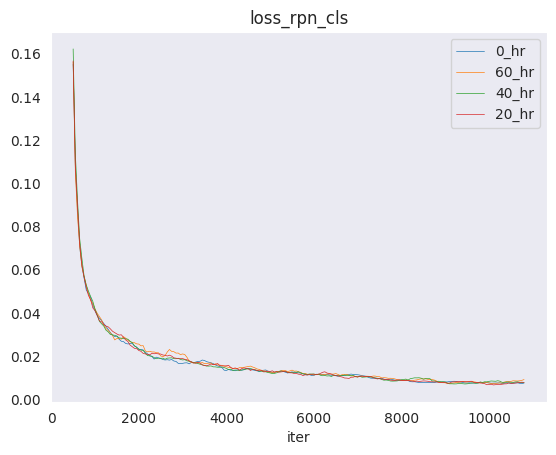

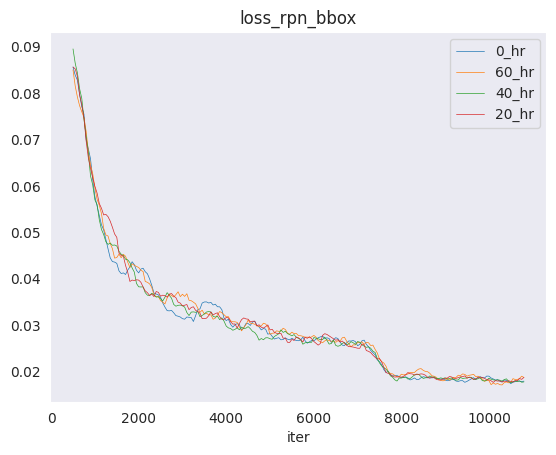

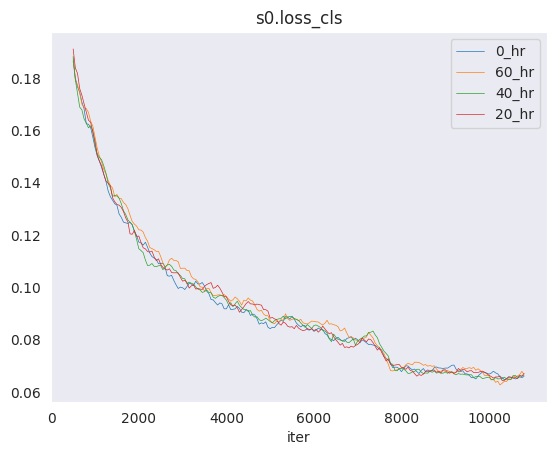

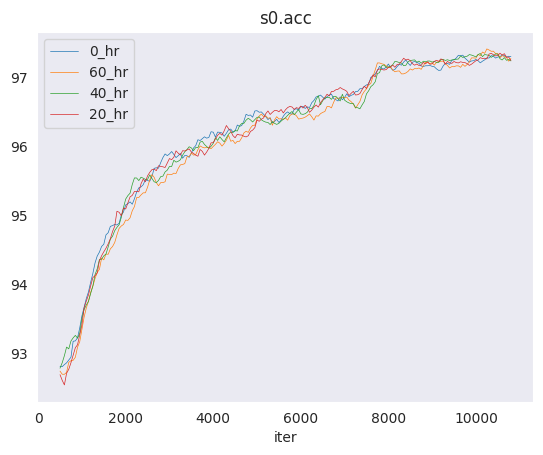

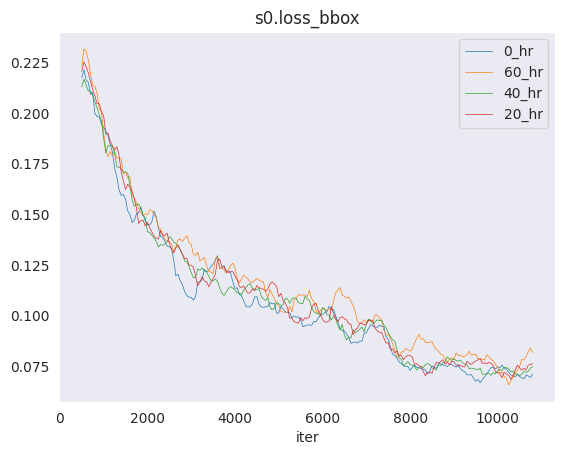

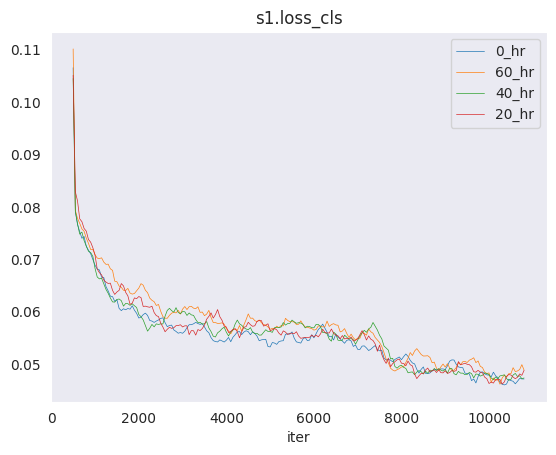

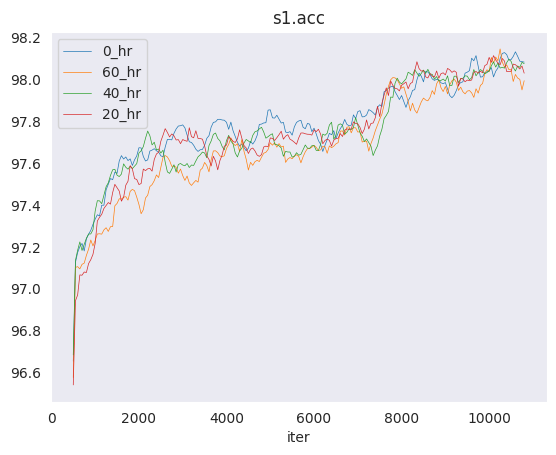

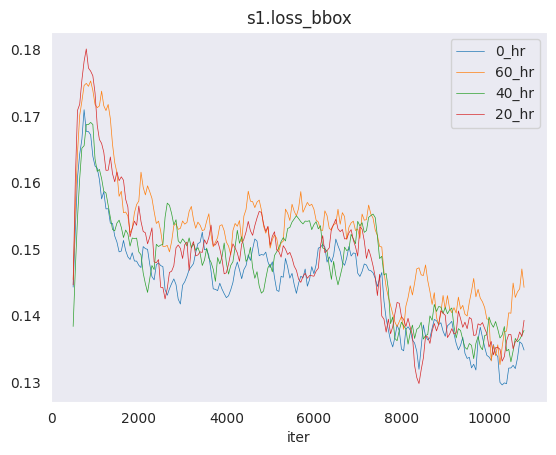

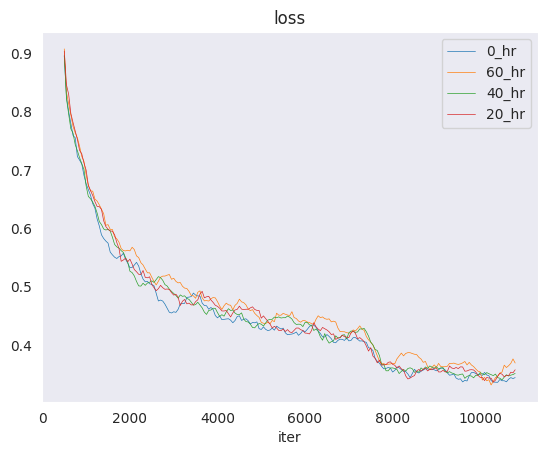

In [110]:
all_metrics = [
    'loss_rpn_cls',
    'loss_rpn_bbox',
    's0.loss_cls',
    's0.acc',
    's0.loss_bbox',
    's1.loss_cls',
    's1.acc',
    's1.loss_bbox',
    'loss'
]

for metric in all_metrics:
    visualize_metric(metric)

### Testing metric analysis

In [ ]:
results = {
    'hr_only': {
        0: {
            'ground_truths': 2183,
            'detections': 2383,
            'recall': 0.967,
            'ap': 0.9,
            'precision': 0.886,
        },
        20: {
            'ground_truths': 1721,
            'detections': 1937,
            'recall': 0.941,
            'ap': 0.902,
            'precision': 0.836,
        },
        40: {
            'ground_truths': 2163,
            'detections': 2413,
            'recall': 0.97,
            'ap': 0.904,
            'precision': 0.87,
        },
        60: {
            'ground_truths': 2178,
            'detections': 2416,
            'recall': 0.962,
            'ap': 0.904,
            'precision': 0.867,
        },
    },
    'lr_only': {
        0: {
            'ground_truths': 2183,
            'detections': 2383,
            'recall': 0.969,
            'ap': 0.901,
            'precision': 0.888,
        },
        20: {
            'ground_truths': 1721,
            'detections': 1930,
            'recall': 0.941,
            'ap': 0.902,
            'precision': 0.839,
        },
        40: {
            'ground_truths': 2163,
            'detections': 2403,
            'recall': 0.97,
            'ap': 0.904,
            'precision': 0.873,
        },
        60: {
            'ground_truths': 2178,
            'detections': 2394,
            'recall': 0.963,
            'ap': 0.905,
            'precision': 0.876,
        },
    }
}


In [ ]:
import matplotlib.pyplot as plt

def visualize_results(results):
    thresholds = [0, 20, 40, 60]
    hr_ap = [results['hr_only'][thr]['ap'] for thr in thresholds]
    lr_ap = [results['lr_only'][thr]['ap'] for thr in thresholds]
    hr_precision = [results['hr_only'][thr]['precision'] for thr in thresholds]
    lr_precision = [results['lr_only'][thr]['precision'] for thr in thresholds]
    hr_recall = [results['hr_only'][thr]['recall'] for thr in thresholds]
    lr_recall = [results['lr_only'][thr]['recall'] for thr in thresholds]

    # Plotting Average Precision (AP)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.plot(thresholds, hr_ap, marker='o', label='HR Only')
    plt.plot(thresholds, lr_ap, marker='o', label='LR Only')
    plt.title('Average Precision (AP) vs Testing Data Percentage')
    plt.xlabel('Percentage of HR Images in Training')
    plt.ylabel('Average Precision (AP)')
    plt.legend()
    plt.grid(True)

    # Plotting Precision
    plt.subplot(1, 3, 2)
    plt.plot(thresholds, hr_precision, marker='o', label='HR Only')
    plt.plot(thresholds, lr_precision, marker='o', label='LR Only')
    plt.title('Precision vs Testing Data Percentage')
    plt.xlabel('Percentage of HR Images in Training')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid(True)

    # Plotting Recall
    plt.subplot(1, 3, 3)
    plt.plot(thresholds, hr_recall, marker='o', label='HR Only')
    plt.plot(thresholds, lr_recall, marker='o', label='LR Only')
    plt.title('Recall vs Testing Data Percentage')
    plt.xlabel('Percentage of HR Images in Training')
    plt.ylabel('Recall')
    plt.legend()
    plt.grid(True)

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()


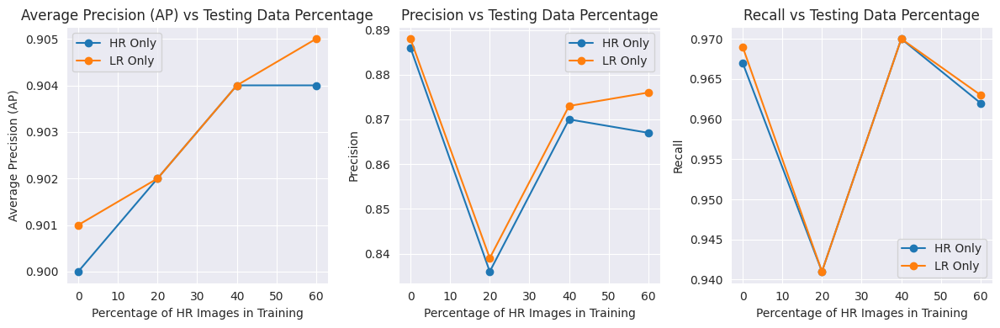

In [ ]:
visualize_results(results)